In [24]:
%matplotlib inline
%config InlineBackend.figure_format = 'retina'

In [25]:
import numpy as np
import scipy as sp
from importlib import reload

In [26]:
from matplotlib import pyplot as plt
import skimage
from skimage import (morphology, segmentation, exposure, feature, filters,
                     measure, transform, util, io, color)

In [27]:
from toolz.curried import *

In [28]:
# this will raise a warning about matplotlib backend

from spotz import imgz, gridder2, segmenter2, spotzplot

In [6]:
import tifffile

# User settings

In [7]:
# change name of file
PLATE_IMG = "/Users/pmagwene/Downloads/L-dopa-testscan-white-farfromplate.tif"

# change number of rows and cols as appropriate
NROWS = 8
NCOLS = 12

# change if you'd like larger or smaller figs
FIG_SIZE = (10, 8)

# Original image

In [14]:
img = imgz.read_image(PLATE_IMG)

In [17]:
img.shape

(1115, 1716, 4)

In [18]:
img = skimage.color.rgba2rgb(tifffile.imread(PLATE_IMG))

In [19]:
img.shape

(1115, 1716, 3)

In [20]:
gimg = skimage.color.rgb2gray(img)

In [21]:
img.shape, gimg.shape

((1115, 1716, 3), (1115, 1716))

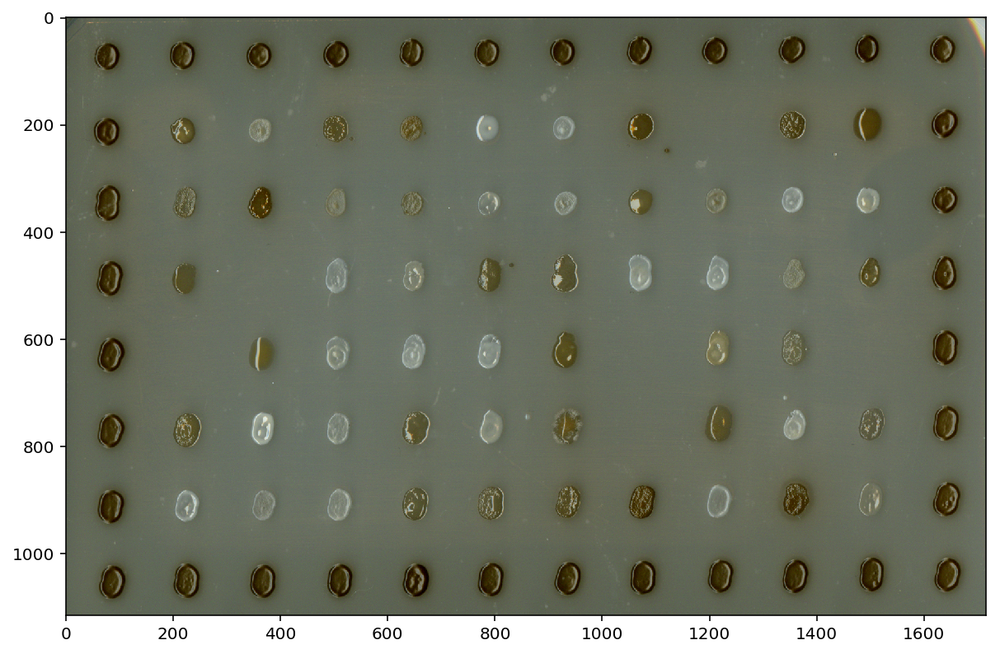

In [31]:
fig = plt.figure(figsize = FIG_SIZE)
plt.imshow(img)

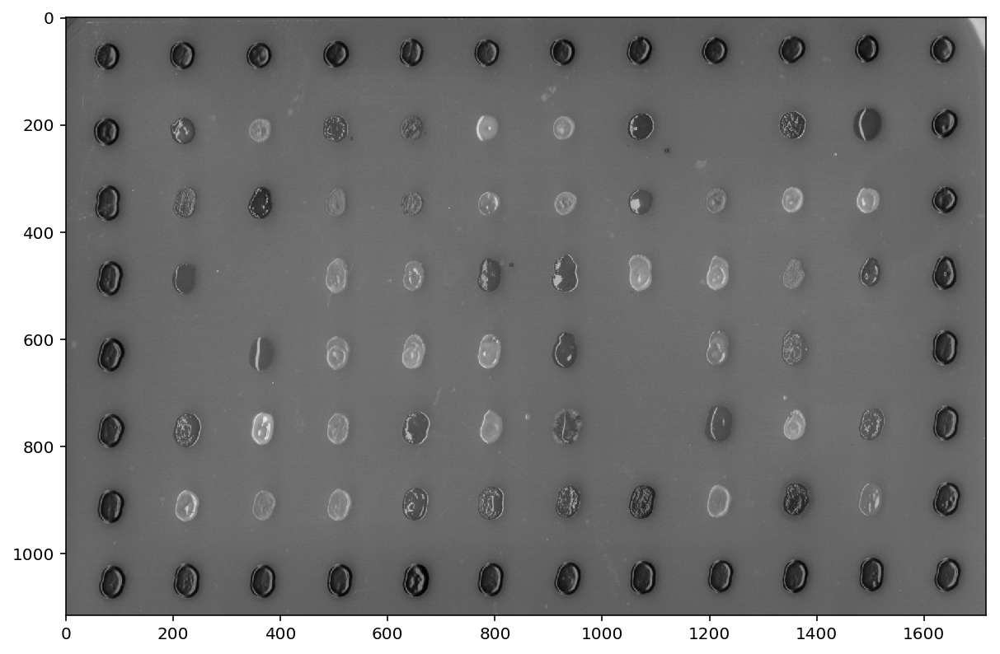

In [30]:
fig = plt.figure(figsize = FIG_SIZE)
imgz.imshowg(gimg)

# Invert image

In [32]:
iimg = imgz.invert(gimg)

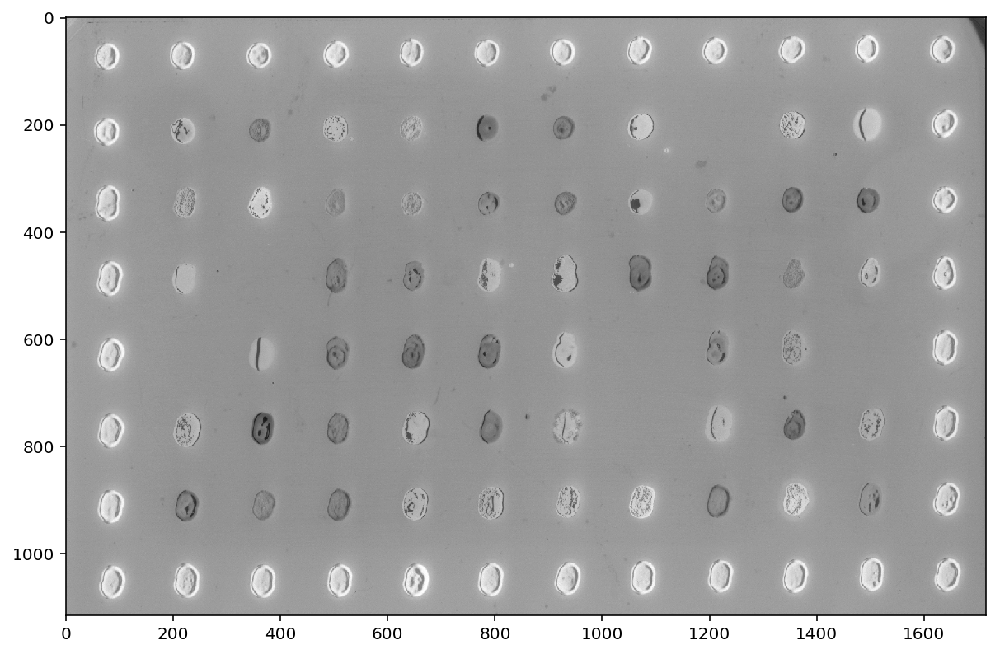

In [33]:
fig = plt.figure(figsize = FIG_SIZE)
imgz.imshowg(iimg)
pass

# Gridding

## Thresholding and binary opening

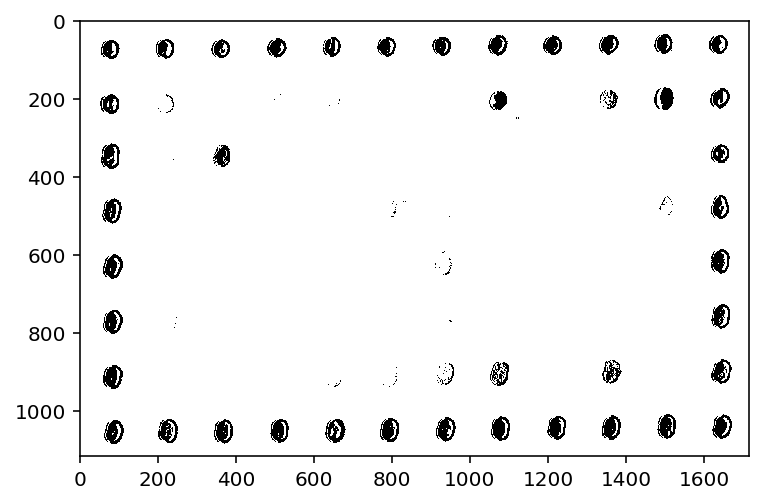

In [34]:
pipe(gimg, imgz.threshold_li, imgz.imshowg)

In [35]:
# initial thresholding and rotation correction
rbimg = pipe(iimg, 
             imgz.threshold_li,
             imgz.disk_opening(3), 
             imgz.clear_border,
             gridder2.fix_rotation)


/Users/pmagwene/anaconda3/lib/python3.7/site-packages/skimage/transform/_warps.py:24: UserWarning: The default multichannel argument (None) is deprecated.  Please specify either True or False explicitly.  multichannel will default to False starting with release 0.16.
  warn('The default multichannel argument (None) is deprecated.  Please '
/Users/pmagwene/anaconda3/lib/python3.7/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "


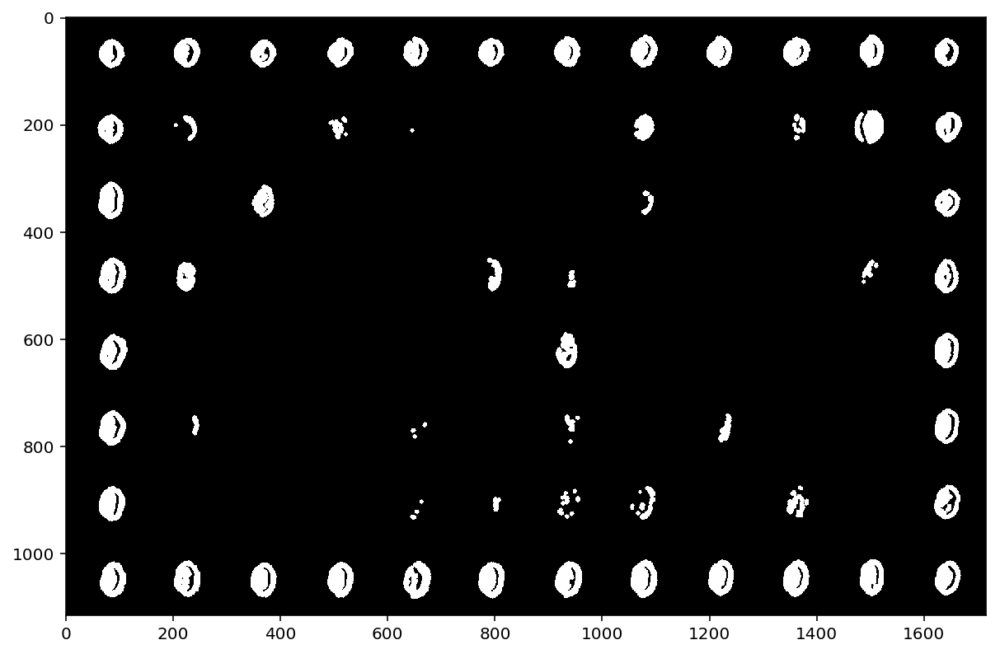

In [36]:
fig = plt.figure(figsize = FIG_SIZE)
imgz.imshowg(rbimg)
pass

## Estimate grid coordinates and draw grid

In [37]:
reload(gridder2.imgz)
reload(gridder2)

<module 'gridder2' from '/Users/pmagwene/gits/github/spotz/gridder2.py'>

In [38]:
g = gridder2.find_grid(NROWS, NCOLS, rbimg)

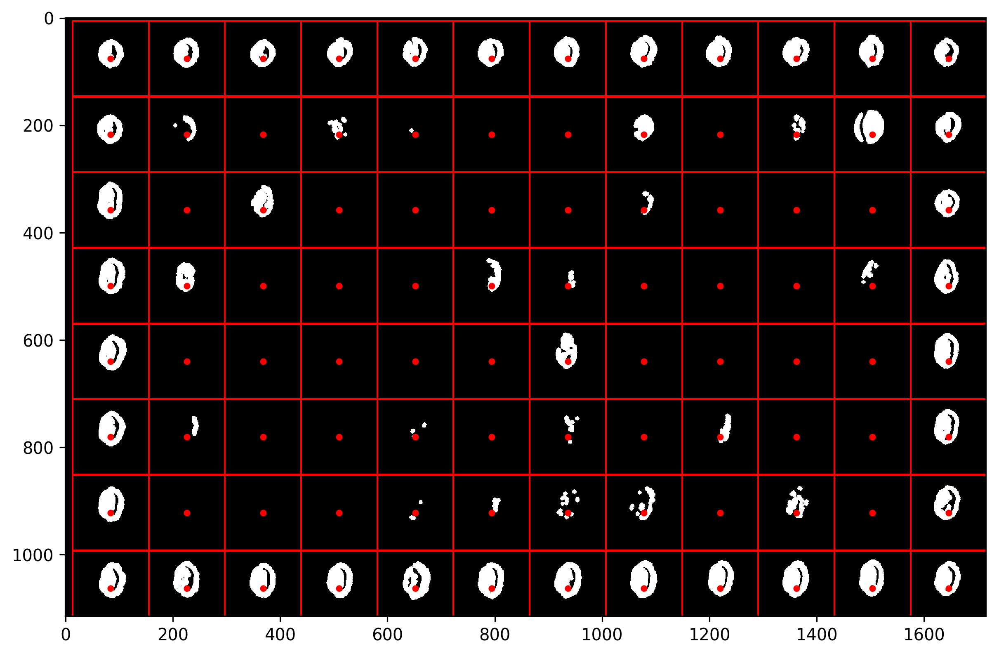

In [39]:
fig = plt.figure(figsize = FIG_SIZE)
imgz.imshowg(rbimg)
ax = plt.gca()
ax.plot(g.centers[:,1], g.centers[:,0], 'r.')
spotzplot.draw_bboxes(g.bboxes, ax)
pass

# Segmentation

## Rethreshold based on grid

In [40]:
reload(segmenter2)

<module 'segmenter2' from '/Users/pmagwene/gits/github/spotz/segmenter2.py'>

In [41]:
filters.threshold_li(iimg)

0.6858954462840088

In [42]:
x = segmenter2.threshold_bboxes(g.bboxes, iimg, threshold_func = filters.threshold_li, border=10)

In [43]:
timg = pipe(iimg,
            segmenter2.threshold_bboxes(g.bboxes, min_local_threshold=0.95),
             imgz.remove_small_objects(50),
             imgz.remove_small_holes(25),
             imgz.disk_closing(5),
             imgz.clear_border) 

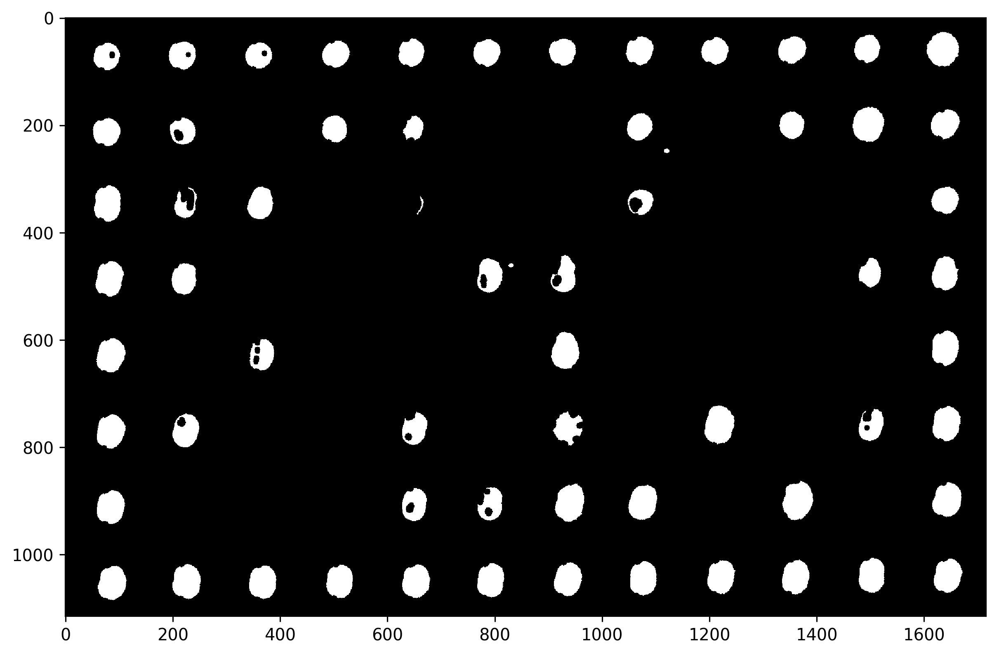

In [44]:
fig = plt.figure(figsize = FIG_SIZE)
imgz.imshowg(timg)
pass

## Segmentation by watershed

### Filter objects by grid

In [45]:
filtered_img, filtered_regions = segmenter2.assign_objects_to_grid(g.centers, 
                                                                   timg, 
                                                                   maxdist = 30) 
filtered_bboxes = [r.bbox if r else None for r in filtered_regions]



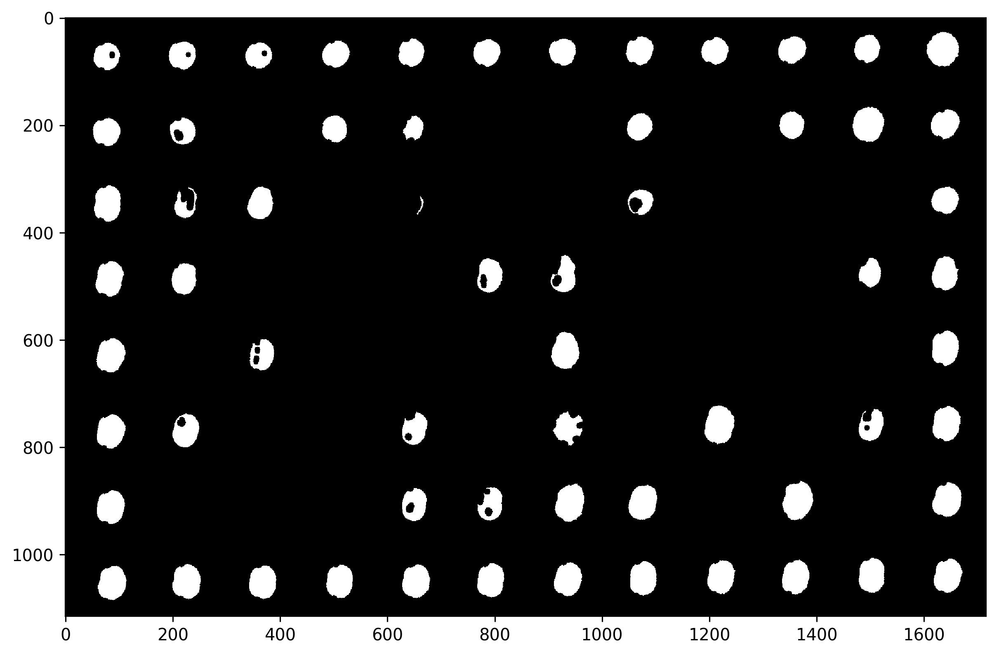

In [46]:
fig = plt.figure(figsize = FIG_SIZE)
imgz.imshowg(filtered_img > 0)
pass

In [47]:
wshed = segmenter2.watershed_segment_bboxes(g.centers, 
                                             filtered_bboxes, 
                                             iimg, timg, 
                                             seed_width = 5)

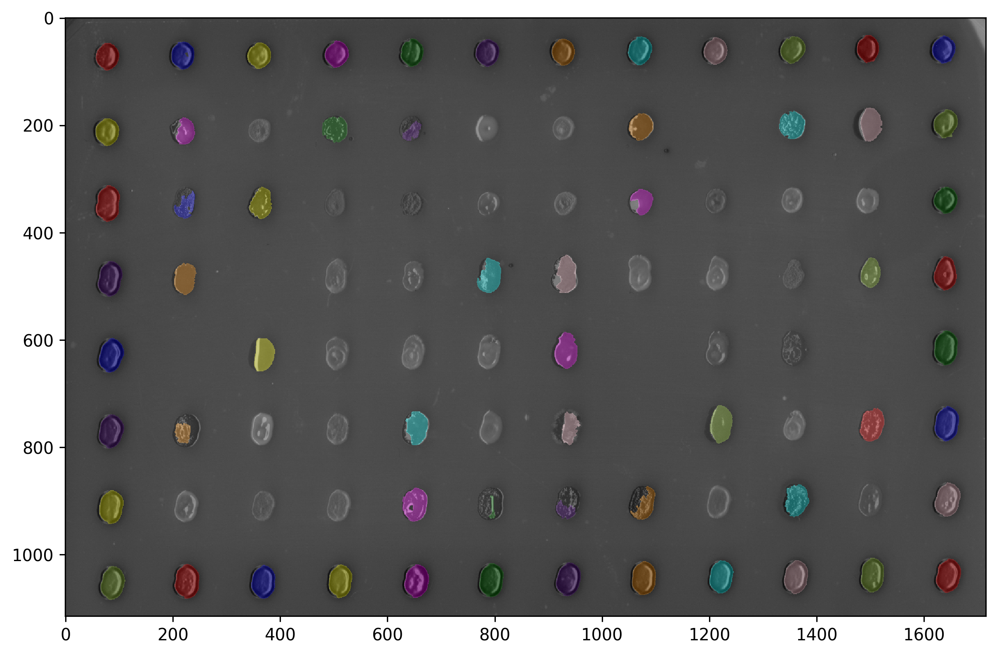

In [48]:
fig = plt.figure(figsize = FIG_SIZE)
ax = plt.gca()
ax.imshow(color.label2rgb(wshed, img, bg_label = 0))
pass

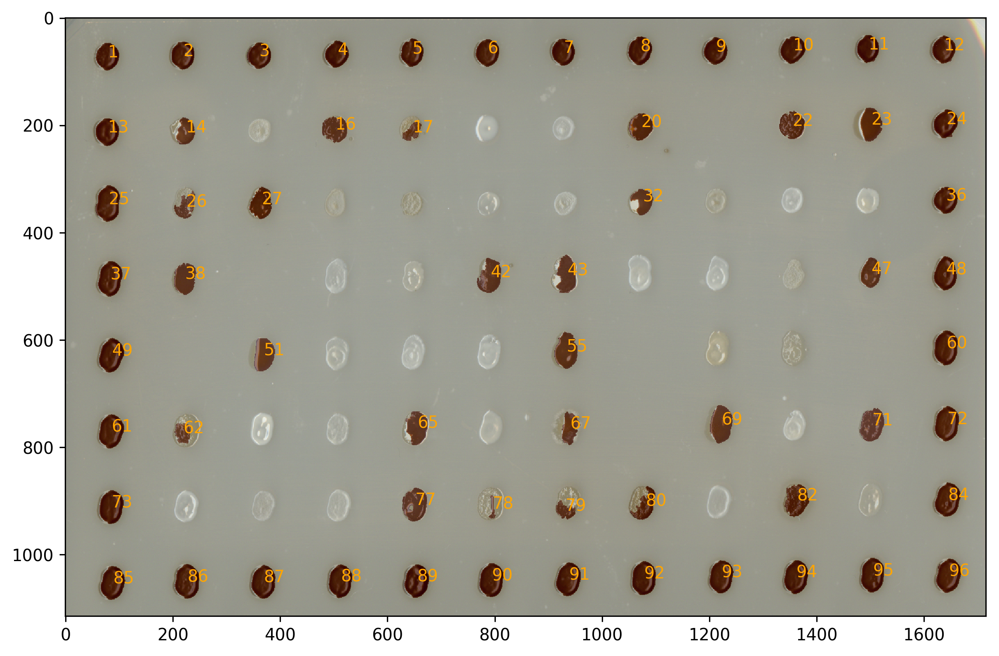

In [49]:
fig, ax = spotzplot.draw_image_and_labels(img, wshed,
                                          mask_cmap = "Reds", alpha = 0.35,
                                         fontsize = 10, textcolor = "orange")
#fig.set_size_inches(FIG_SIZE)
fig.set_size_inches(FIG_SIZE)
plt.savefig("melanized-wmask-example.png", dpi=300)

In [139]:
?plt.savefig

Signature: plt.savefig(*args, **kwargs)
Docstring:
Save the current figure.

Call signature::

  savefig(fname, dpi=None, facecolor='w', edgecolor='w',
          orientation='portrait', papertype=None, format=None,
          transparent=False, bbox_inches=None, pad_inches=0.1,
          frameon=None, metadata=None)

The output formats available depend on the backend being used.

Parameters
----------

fname : str or file-like object
    A string containing a path to a filename, or a Python
    file-like object, or possibly some backend-dependent object
    such as :class:`~matplotlib.backends.backend_pdf.PdfPages`.

    If *format* is *None* and *fname* is a string, the output
    format is deduced from the extension of the filename. If
    the filename has no extension, :rc:`savefig.format` is used.

    If *fname* is not a string, remember to specify *format* to
    ensure that the correct backend is used.

Other Parameters
----------------

dpi : [ *None* | scalar > 0 | 'figure' ]
 

In [ ]:


c = [(i[500]/j[500]) for (i,j) in zip(r.true_freqs[:4], r.true_freqs[1:])]

In [1]:
x = [1,2,3]
[i**2 for i in x]

[1, 4, 9]

In [4]:
x = [1,2,3]
y = [4,5,6]

[(i+j)**2 for (i,j) in zip(x,y)]

[25, 49, 81]

In [3]:
x = [1,2,3]
y = [4,5,6]
list(zip(x,y))

[(1, 4), (2, 5), (3, 6)]